<a href="https://colab.research.google.com/github/PulkitAppz/Capstone_AIML_19B/blob/master/CapStone_Submission_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CAPSTONE PROJECT: PNEUMONIA DETECTION**
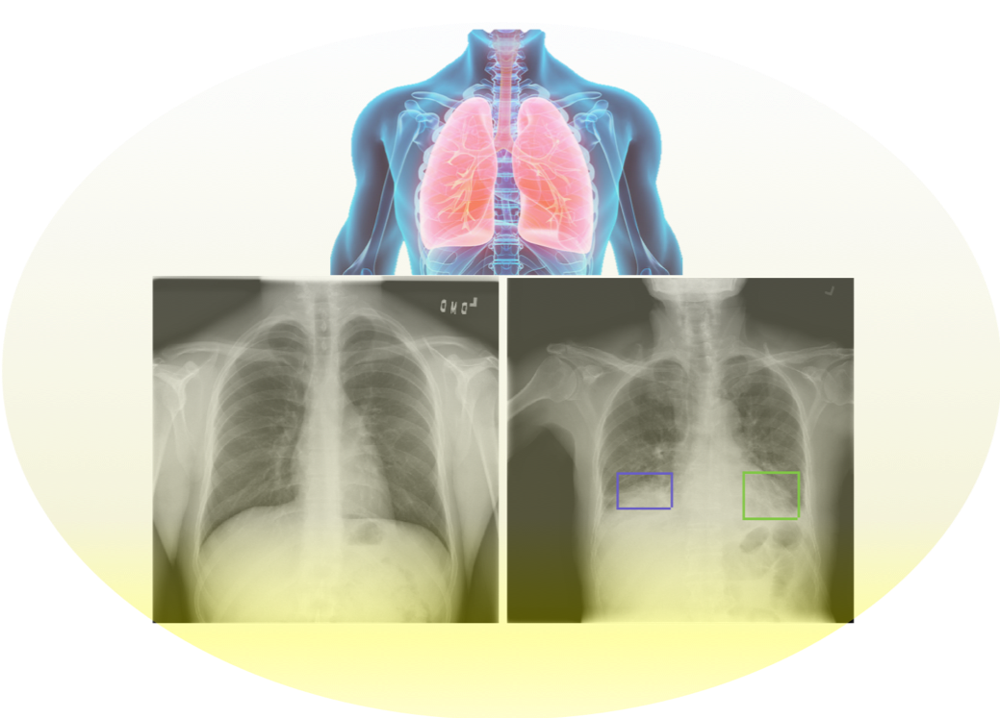

### **PROJECT DESCRIPTION**

In this capstone project, the goal is to build a pneumonia detection system by locating the position(s) of inflammation in patient Chest X-Ray(CXR) images. The project explores a variety of deep neural network architectures to identify optimum detection scheme.
In X-Ray images, tissues with sparse material, such as lungs which are full of air, do not absorb the X-rays and appear black in the image, indicating transparency. Dense tissues such as bones absorb X-rays, indicate opacity and appear white in the image. We are detecting “lung opacities” which are indicative of pneumonia. X-ray images in the dataset given are identified as "normal" lungs or annotated by boxes as pneumonia infected "lung opacities" by practicing radiologists. The "lung opacities" typically appear grey and "hazy" in X-ray images with partial transparency and with the lack of a clear boundary. The additional complexity is that there are also X-ray images where lung opacities are not pneumonia related such as in the case of lung tumors that maybe cancer related or in some cases, chest cavity filled with fluid or even in the case of heart enlargement. In the data, most of these aforementioned cases are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the appearance of true pneumonia. 

The X-ray medical images are stored in DICOM format files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data.

Details about the data and the dataset files are extracted from the link,

https://www.kaggle.com/c/rsna-pneumonia-detection-challenge/data

### **INITIATION - LOAD REQUIRED LIBRARIES AND MOUNTING DRIVE ON COLAB**

In [2]:
# Installing pydicom to read dcm files
!pip install -q pydicom

     |████████████████████████████████| 35.5MB 92kB/s 


In [3]:
# Import necessary packages/Library
import pydicom as dcm
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import os, zipfile, random, csv
import seaborn as sns
import warnings
import glob
#
from matplotlib.pyplot import show
from matplotlib.patches import Rectangle
from tqdm import tqdm_notebook
from pydicom import dcmread
from pydicom.data import get_testdata_file
#
import tensorflow as tf
from tensorflow import keras
import keras
from skimage.transform import resize
import cv2
#
warnings.filterwarnings('ignore')
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
# Set path to G-Drive
from google.colab import drive
drive.mount('/content/drive')
print(os. getcwd())
print(os.listdir())
os.chdir('/content/drive/My Drive/Colab Notebooks/Capstone')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
/content
['.config', 'drive', 'sample_data']


### **DOWNLOAD DATASET**

In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"pulkitswami7","key":"0396ff6b1c433f1ef961d8233d7ee37d"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
'chmod 600 /root/.kaggle/kaggle.json'

'chmod 600 /root/.kaggle/kaggle.json'

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle
!kaggle competitions download -c rsna-pneumonia-detection-challenge

Processing /root/.cache/pip/wheels/57/4e/e8/bb28d035162fb8f17f8ca5d42c3230e284c6aa565b42b72674/kaggle-1.5.6-cp36-none-any.whl
  Found existing installation: kaggle 1.5.6
    Uninstalling kaggle-1.5.6:
      Successfully uninstalled kaggle-1.5.6
100% 3.66G/3.66G [00:49<00:00, 6.44MB/s]
100% 3.66G/3.66G [00:49<00:00, 80.1MB/s]


In [ ]:
!ls


CapStone_Submission1.ipynb  kaggle.json  rsna-pneumonia-detection-challenge.zip


In [ ]:
file_name = 'rsna-pneumonia-detection-challenge.zip'
files = zipfile.ZipFile(file_name, 'r')
files.extractall()

In [ ]:
!ls


'GCP Credits Request Link - RSNA.txt'	  stage_2_sample_submission.csv
 kaggle.json				  stage_2_test_images
 rsna-pneumonia-detection-challenge.zip   stage_2_train_images
 stage_2_detailed_class_info.csv	  stage_2_train_labels.csv


### **EXPLORATIVE DATA ANALYSIS**


1.  Images for testing and training are in the folders: stage_2_train_images and stage_2_test_images.
2.  Training data 1: "stage_2_train_labels.csv" containing the box annotation coordinates and the targets (1-pneumonia and 0-not pneumonia)
3.  Training data 2: "stage_2_detailed_class_info.csv" containing detailed information about the classes in the training set ("normal", "lung opacities" and "No lung opacity/not normal" classes)


**DATASET SUMMARY**

In [ ]:
print('***'*10, 'Datasets Summary', '***'*10)
train_labels = pd.read_csv('stage_2_train_labels.csv')
class_info = pd.read_csv('stage_2_detailed_class_info.csv')

print(f'Train Labels dataframe has {train_labels.shape[0]} rows and {train_labels.shape[1]} columns')#(0 for rows and 1 for columns)
print(f'Class info dataframe has {class_info.shape[0]} rows and {class_info.shape[1]} columns')

****************************** Datasets Summary ******************************
Train Labels dataframe has 30227 rows and 6 columns
Class info dataframe has 30227 rows and 2 columns


From above Output, we can say there are 30227 patient records.  
Lets check now for any duplicate IDs.

In [ ]:
print('No. of Unique patient IDs in train_labels:', train_labels['patientId'].nunique() )
print('No. of Unique patient IDs in class_info:', class_info['patientId'].nunique() )

No. of Unique patient IDs in train_labels: 26684
No. of Unique patient IDs in class_info: 26684


In [ ]:
print('No. of Duplicate Ids:{}' .format((30227)-(train_labels['patientId'].nunique())) )

No. of Duplicate Ids:3543


In [ ]:
#
# Dataframe basic data study with report
#
def df_data_study(df):
#
# basic data info
    print("\033[1m"+'\nSHAPE\n'+"\033[0m")
    print(df.shape)
    print("\033[1m"+'\nHEAD(5)\n'+"\033[0m")
    print(df.head())
    print("\033[1m"+'\nINFO\n'+"\033[0m")
    print(df.info())
    print("\033[1m"+'\nNUMERIC DATA DESCRIPTION\n'+"\033[0m")
    print(df.describe())
#
# null count and %age
    df_null=df.isnull().sum()
    df_count=df.isnull().count()
    null_percent=df_null*100/df_count
    print("\033[1m"+'\nNULL DATA TABLE\n'+"\033[1m")
    return pd.concat([df_null, round(null_percent,1)], axis=1, keys=['Null Count', 'Null_percent'])
#

In [ ]:
print("\033[1m" + 'TRAIN LABELS DATAFRAME' + "\033[0m")
df_data_study(train_labels)

TRAIN LABELS DATAFRAME

SHAPE

(30227, 6)

HEAD(5)

                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1

INFO

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usag

,Null Count,Null_percent
patientId,0,0.0
x,20672,68.4
y,20672,68.4
width,20672,68.4
height,20672,68.4
Target,0,0.0


In [ ]:
print("\033[1m" + 'TRAIN LABELS DATAFRAME' + "\033[0m")
df_data_study(train_labels)

TRAIN LABELS DATAFRAME

SHAPE

(30227, 6)

HEAD(5)

                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1

INFO

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usag

,Null Count,Null_percent
patientId,0,0.0
x,20672,68.4
y,20672,68.4
width,20672,68.4
height,20672,68.4
Target,0,0.0


 
**BASIC DATA SUMMARY**

*   Both dataframes have patient id common identifier and 30227 patient samples obtained from CXR of 26684 unique patients

*   Clearly 6 columns in train_labels dataframe with 4 numeric real data (rectangle of identified pneumonia box each row)
train_labels also has one target class column which is a classifier for patient as pneumonia patient or not (1-yes/0-no)

* 2 columns in the class info dataframe having the 3 classes of data for CXR images(normal, lung opacity and abnormal)for each patient sample

* The training labels data has 68.4% null data for the box identifier of patient CXR which should ideally correspond to number of patients identified with no pneumonia

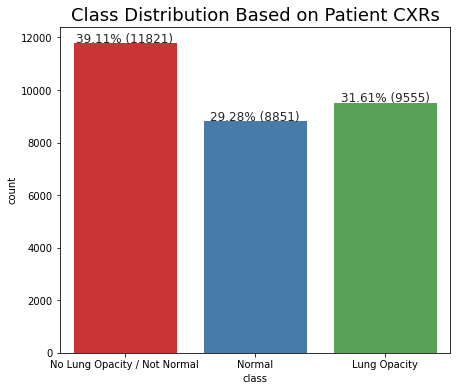

In [ ]:
# DATA VISUALIZATION OF PATIENT CLASS DISTRIBUTION BASED ON CXR EVALUATIONS
#
fig,ax= plt.subplots(1,1,figsize=(7,6))
sns.set(style="darkgrid")
plt.title('Class Distribution Based on Patient CXRs', fontsize=18)
sns.countplot(class_info['class'], palette="Set1")
total=float(len(class_info))
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}% ({:d})'.format(100*height/total, height),
            ha="center")
#
plt.show()

**Lung Opacity class is 31.61% (9555, Target=1) which clearly complements the 68.4% {11821 (39.1%) +8851 (29.3%) =20672 (68.4%), Target=0} null data records in train labels data set**

In [ ]:
#
# Let's now merge the dataframes into one with common patientID criteria
#
train_labels=train_labels.merge(class_info,left_on='patientId', right_on='patientId',how='inner')
print(train_labels.shape)

(37629, 7)


In [ ]:
#
# Drop duplicate records in merged dataframe
#
train_labels=train_labels.drop_duplicates()
print(train_labels.shape)

(30227, 7)


### Let's consider only the pneumonia patient records and then look at the distribution of the locations of the annotated box centers for a sample set of 3000 patients

In [ ]:
train_target1=train_labels[train_labels['Target']==1]

<function matplotlib.pyplot.show>

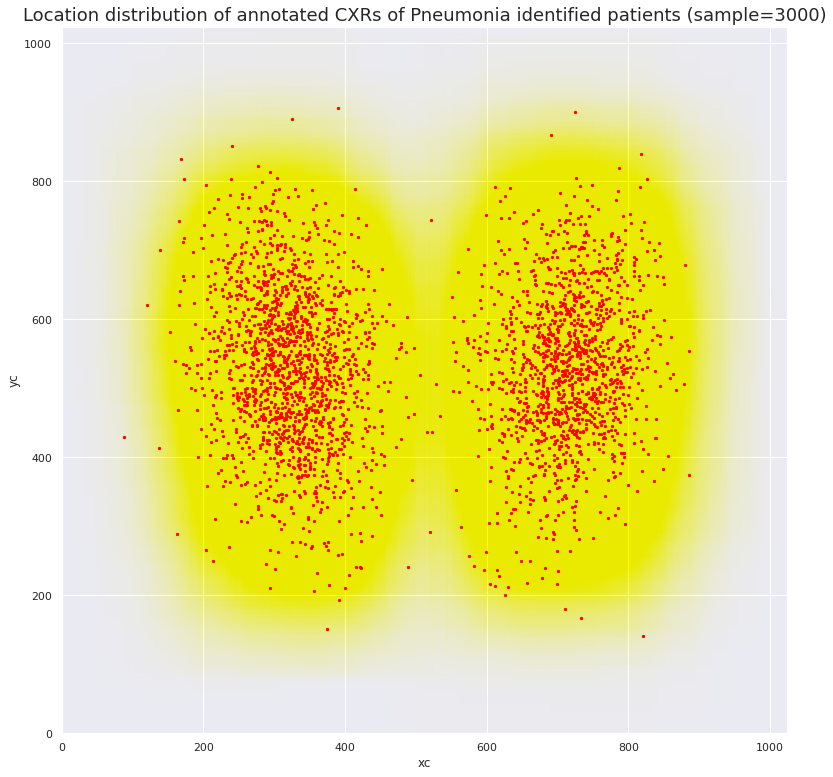

In [ ]:
#
fig,ax=plt.subplots(1,1,figsize=(13,13))
train_target2=train_target1.sample(3000)
train_target2['xc']=train_target2['x']+train_target2['width']/2
train_target2['yc']=train_target2['y']+train_target2['height']/2
plt.title('Location distribution of annotated CXRs of Pneumonia identified patients (sample=3000)', fontsize=18)
train_target2.plot.scatter(x='xc',y='yc', xlim=(0,1024),ylim=(0,1024), ax=ax, marker='.',c="red")
for i,annot in train_target2.iterrows():
    ax.add_patch(Rectangle(xy=(annot['x'],annot['y']),width=annot['width'],height=annot['height'],alpha=0.004, color="yellow"))
plt.show

### Clearly rectangular annotation box centers are concentrated between pixel column x=250to400 & x=650to800(symmetric) and pixel row y=400to700 



---


***Note: This could be useful while pre-processing data in terms of image resizing, trimming etc prior to training***

### Let's create another dataframe by eliminating the class "No Lung Capacity / Not Normal" (train_labels1) for potential later use while considering data preparation for ML model build

In [ ]:
train_labels1=train_labels[train_labels['class']!='No Lung Opacity / Not Normal']
print(train_labels1.shape)

(18406, 7)


**DATA VISUALIZATION BASED ON PATIENT CLASS DISTRIBUTION ACROSS "NORMAL" and "LUNG OPACITY" CLASSES**

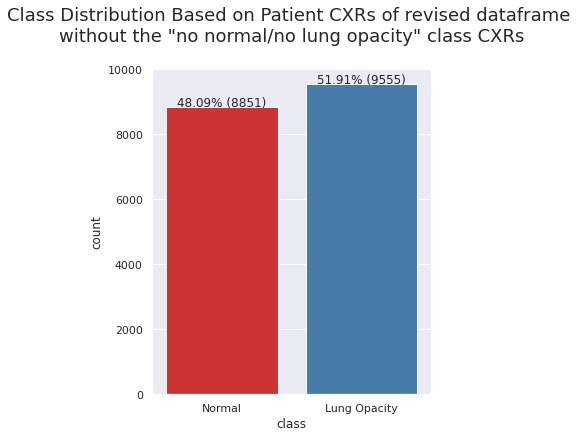

In [ ]:
# DATA VISUALIZATION OF PATIENT CLASS DISTRIBUTION BASED ON CXR EVALUATIONS
#
fig,ax= plt.subplots(1,1,figsize=(5,6))
sns.set(style="darkgrid")
plt.title('Class Distribution Based on Patient CXRs of revised dataframe \nwithout the "no normal/no lung opacity" class CXRs\n', fontsize=18)
sns.countplot(train_labels1['class'], palette="Set1")
total=float(len(train_labels1))
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}% ({:d})'.format(100*height/total, height),
            ha="center")
#
plt.show()



---


***Note: Using just the "Normal" and "Lung Opacity" class data records will give a more balanced distribution of samples across the target classification for training of the model***

**TABULATION OF DATASET BY NUMBER OF CHEST X-RAY (CXR) COUNT AND CLASSIFICATON PER PATIENT**

In [ ]:
# 
CXRs=train_labels.groupby(['patientId','Target','class'])['patientId'].count()
df1=pd.DataFrame(data={'CXRs_count':CXRs.values},index=CXRs.index).reset_index()
#Class_g=CXRs.groupby(['patientId','Target','class'])['class']
#Target_g=train_labels.groupby(['patientId','Target','class'])['Target']
new_df=df1.drop(['patientId'],axis=1)
new_df1=new_df.groupby(['Target','class','CXRs_count'])['CXRs_count'].count()
print(new_df1)

Target  class                         CXRs_count
0       No Lung Opacity / Not Normal  1             11821
        Normal                        1              8851
1       Lung Opacity                  1              2614
                                      2              3266
                                      3               119
                                      4                13
Name: CXRs_count, dtype: int64


### **EXPLORE DICOM-IMAGE DATASET**

**Load Path + Filenames for the Image datasets and check out a sample and its size**

In [21]:
imgArr = list(set(glob.glob('stage_2_train_images/'+'*.dcm')))
print(imgArr[5])
print(len(imgArr))

stage_2_train_images/d29caa55-2027-4078-8d93-c6aaa25f7044.dcm
26684


**Note that this count(26684) of images matches with the CXR count from previous table**

In [ ]:
img=dcm.read_file(imgArr[5])
img

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.15029.1517874383.165770
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.15029.1517874383.165770
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

### The Key Data to extract includes
1.   Pixel Data: for images
2.   Patient's ID
3.   Patient's Sex
4.   Patient's Age
5.   Modality


### Let's Display a few sample CXR images

In [ ]:
def disp_dicom_img(data):
    img_data=list(data.T.to_dict().values())
    fig,ax=plt.subplots(3,3,figsize=(27,27))
    for i,row in enumerate(img_data):
        image_fname=row['patientId']+'.dcm'
        image_fpath=os.path.join("stage_2_train_images/",image_fname)
        row_img_data=dcm.read_file(image_fpath)
        modality=row_img_data.Modality
        age=row_img_data.PatientAge
        sex=row_img_data.PatientSex
        data_row_img=dcm.dcmread(image_fpath)
        ax[i//3,i%3].imshow(data_row_img.pixel_array,cmap=plt.cm.bone)
        ax[i//3,i%3].axis('off')
        ax[i//3,i%3].set_title('ID: {}\nModality: {} Age: {} Sex: {} Target: {}\nClass:  {}'.format(row['patientId'],modality,age,sex,row['Target'],row['class']))
        rows1=train_labels[train_labels['patientId']==row['patientId']]
        box=list(rows1.T.to_dict().values())
        for j,row2 in enumerate(box):
          ax[i//3,i%3].add_patch(Rectangle(xy=(row2['x'],row2['y']),width=row2['width'],height=row2['height'],alpha=0.1,color="blue",))
    plt.show()

### **PATIENT CHEST X-RAY SAMPLES WITH IDENTIFIED PNEUMONIA INFECTION**
From Dataframe, Target = 1, Class = "Lung Opacity"

9 Samples Displayed with Box Annotations

Note: Hazy and boundary-less grey patches/zones are observed in the lung cavity within the boxes in the shown samples. We can explore transforming to sharper images for data pre-processing 

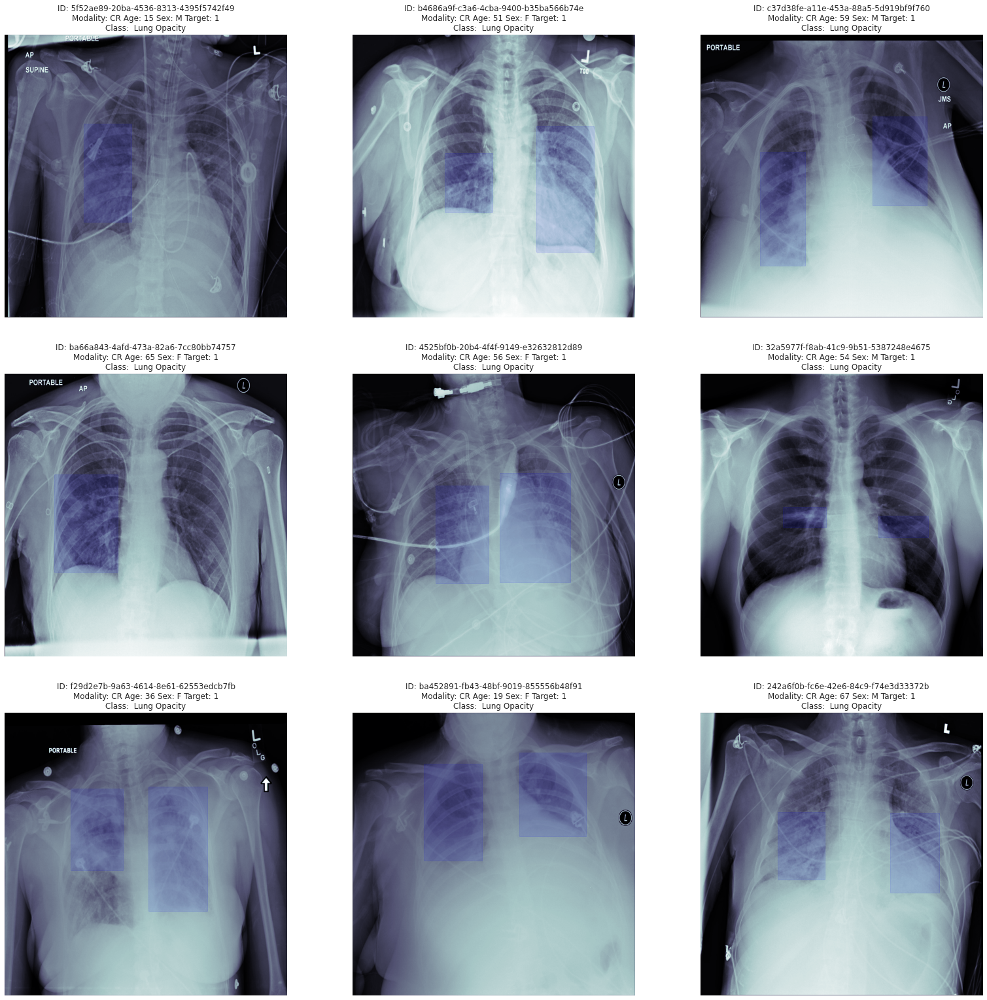

In [ ]:
disp_dicom_img(train_labels[train_labels['Target']==1].sample(9))

### **PATIENT X-RAY SAMPLES FOR NORMAL PATIENTS**
From Dataframe, Target = 0, Class = "Normal"

9 Samples Displayed to Distiniguish with Infected Patient X-Rays Above

In the image samples shown below, the lung cavity is pretty much clear and black indicating trasparent air cavity and infection free zones

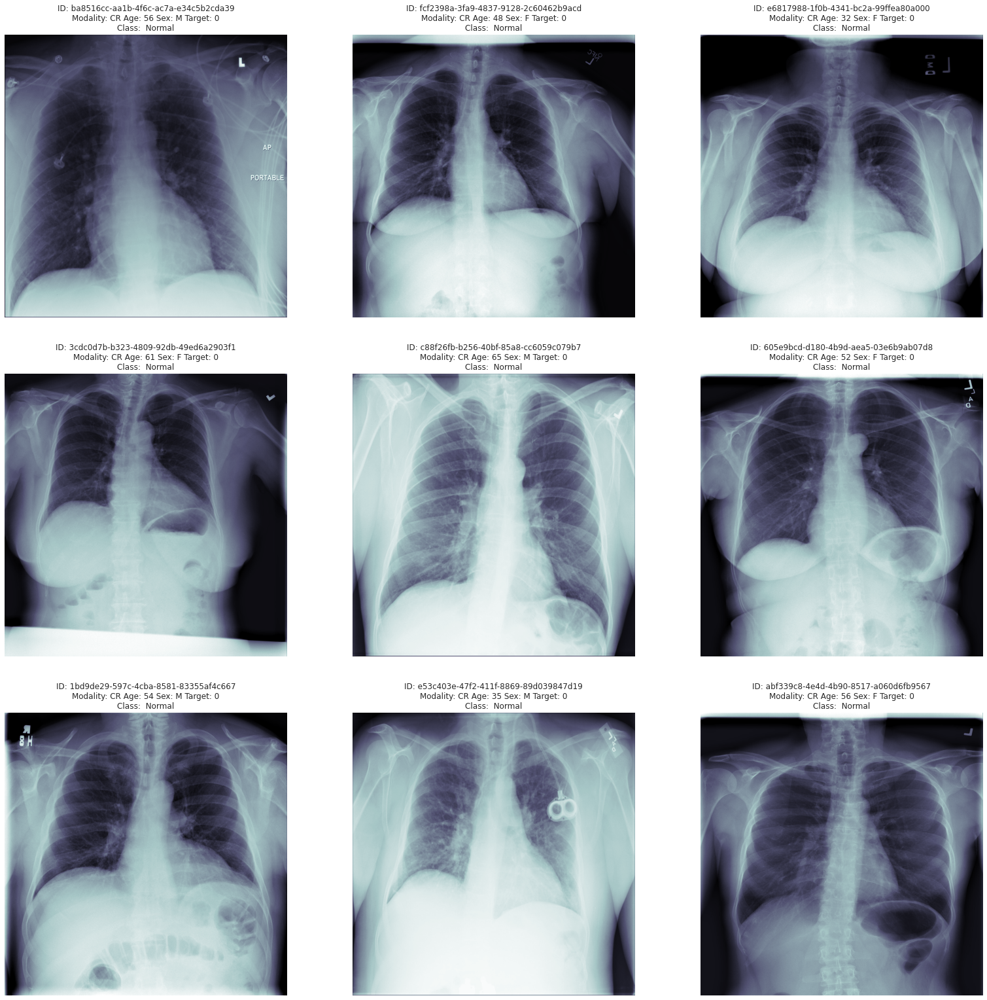

In [ ]:
disp_dicom_img(train_labels[train_labels['class']=='Normal'].sample(9))

## **PATIENT X-RAY SAMPLES WITH THE CLASS "NOT NORMAL or NO LUNG OPACITY"**
9 Samples are Plotted for reference

Many types of abnormalities is seen in images such as 

*   Enlarged heart
*   Pleural effusion(chest filled with fluid) or consolidations
*   Unclear Image 

Note: It may be a good idea to not consider the dataset sample with this class for initial training of model.





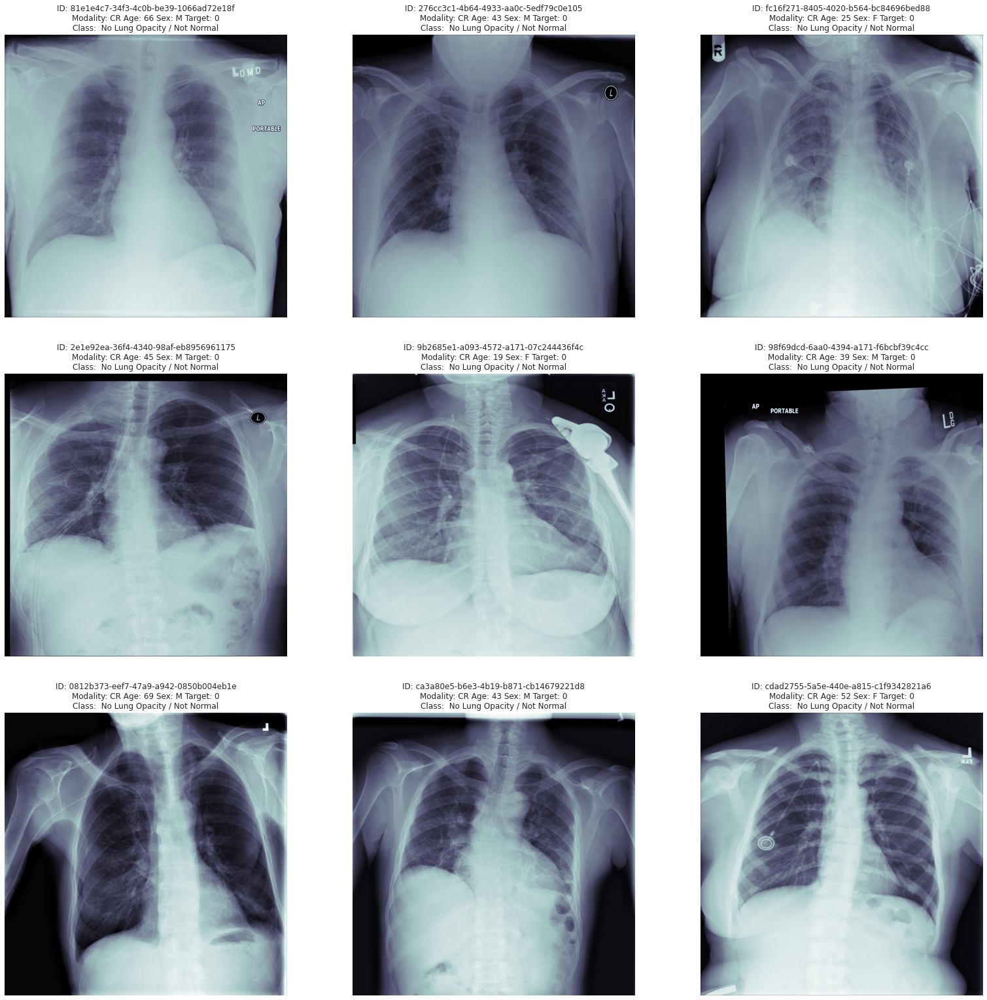

In [ ]:
disp_dicom_img(train_labels[train_labels['class']=='No Lung Opacity / Not Normal'].sample(9))

In [ ]:
def image_path_arr(data_df): 
  data_df['PathName']=0
  for i in range(len(data_df)):
    data_df['PathName'][i]=os.path.join('stage_2_train_images/',data_df['patientId'][i]+'.dcm')
  return data_df

In [ ]:
data_df  = image_path_arr(train_labels)

In [ ]:
data_df=data_df.drop(['Age'],axis=1)
data_df.head()

,patientId,x,y,width,height,Target,class,PathName
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...


In [ ]:
print(len(imgArr))
print(data_df.shape)

26684
(30227, 8)


In [ ]:
data_df['Age']=0
for i in range(len(data_df)):
    df_imagePath = data_df['PathName'][i]
    print(i)
    img=dcm.dcmread(df_imagePath,force=True)
    print(img.PatientAge)
    data_df['Age'][i]=img.PatientAge
    print(data_df['Age'][i])

Lets find outliers in age and all other exploration based on age factor of patients.

****************************** Age outliers detection ******************************
Min age in the training dataset: 1
Max age in the training dataset: 105
75th Percentile of age in the training dataset: 59.0


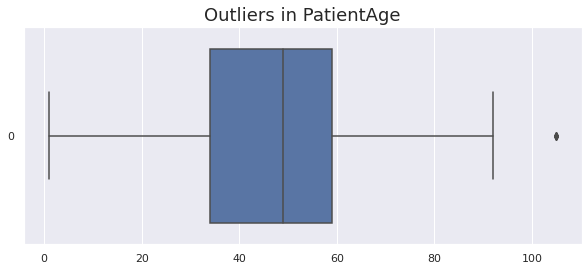

In [ ]:
print('***'*10, 'Age outliers detection', '***'*10)
print('Min age in the training dataset: {}'.format(data_df['Age'].min()))
print('Max age in the training dataset: {}'.format(data_df['Age'].max()))
print('75th Percentile of age in the training dataset: {}'.format(data_df['Age'].quantile(0.75)))

fig = plt.figure(figsize = (10, 4))
ax = sns.boxplot(data = data_df['Age'], orient = 'h').set_title('Outliers in PatientAge', fontsize=18)

In [ ]:
#Calculate Number of outliers 

Q1 = data_df['Age'].quantile(0.25)
Q3 = data_df['Age'].quantile(0.75)
IQR = Q3 - Q1
min = Q1 - 1.5 * IQR
max = (Q3 + 1.5 * IQR)
print('No. of outliers:',((data_df['Age'] < (Q1 - 1.5 * IQR)) | (data_df['Age'] > (Q3 + 1.5 * IQR))).sum())

No. of outliers: 5


In [ ]:
data_df['Age'].describe().astype(int)

count    30227
mean        46
std         16
min          1
25%         34
50%         49
75%         59
max        155
Name: Age, dtype: int64

**Max age of a patient is observed to be 155 which in unreal. Fixing such outliers by capping the age at 105**

In [ ]:
count = 0
for i in range(len(data_df.Age)):
  if data_df.Age[i]>105:
    count = count + 1
    data_df.Age[i] = 105
    if count == 5:# bcz only 5 outliers 
      break
data_df['Age'].describe().astype(int)


count    30227
mean        46
std         16
min          1
25%         34
50%         49
75%         59
max        105
Name: Age, dtype: int64

**Now Let's visualise the Age distribution.**

(43.0, 63.0]     13919
(22.0, 43.0]      8766
(63.0, 84.0]      4881
(1.0, 22.0]       2551
(84.0, 105.0]      110
Name: Age, dtype: int64

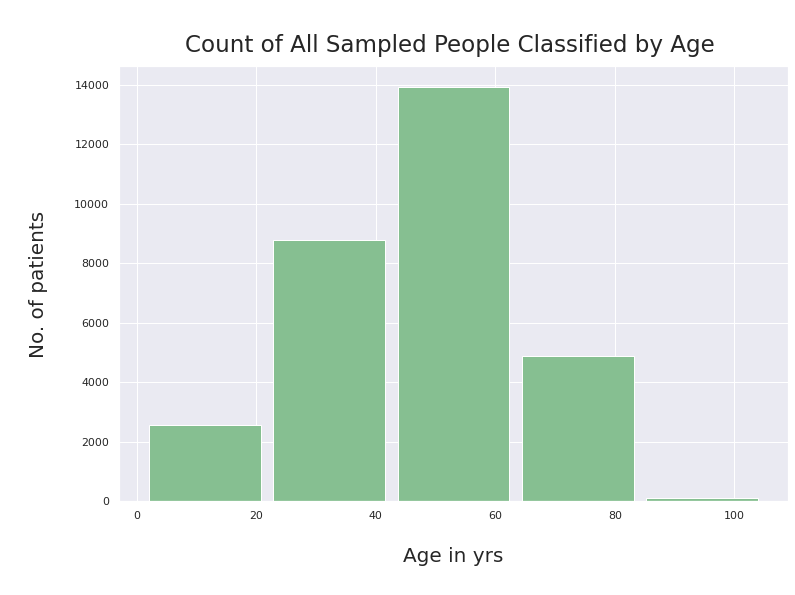

In [ ]:
ax = data_df.hist(column='Age', bins=5, grid=True, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.xlabel('\nAge in yrs\n', fontsize = 20)
plt.ylabel('\nNo. of patients\n', fontsize = 20)
plt.title("\nCount of All Sampled People Classified by Age ", y=1.02, fontsize=23);

arr = pd.cut(data_df['Age'], bins = 5, precision = 0)
arr.value_counts()

(37.0, 56.0]    3239
(56.0, 74.0]    2763
(19.0, 37.0]    2438
(1.0, 19.0]      747
(74.0, 92.0]     368
Name: Age, dtype: int64

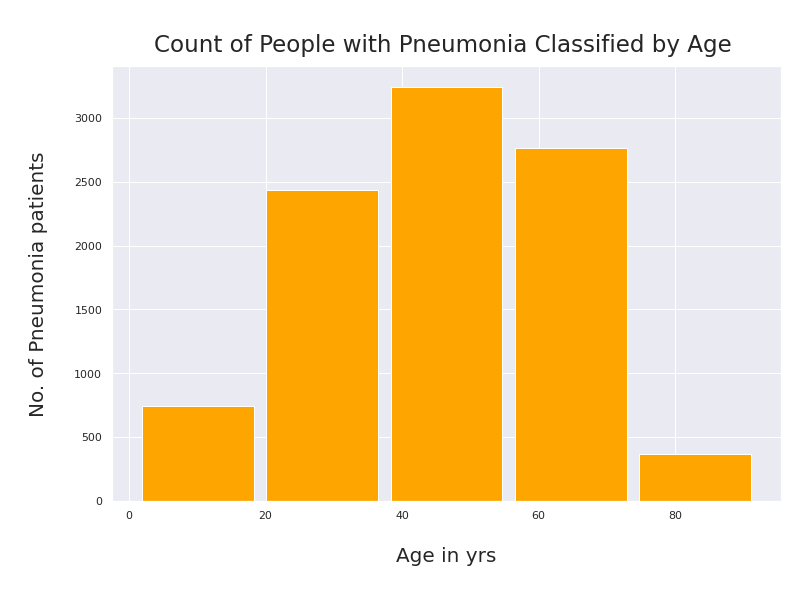

In [ ]:
data_df1=data_df[data_df['Target'] == 1]
ax = data_df1.hist(column='Age', bins=5, grid=True, figsize=(12,8), color='orange', zorder=2, rwidth=0.9)
plt.xlabel('\nAge in yrs\n', fontsize = 20)
plt.ylabel('\nNo. of Pneumonia patients\n', fontsize = 20)
plt.title("\nCount of People with Pneumonia Classified by Age ", y=1.02, fontsize=23);
arr = pd.cut(data_df1['Age'], bins = 5, precision = 0)
arr.value_counts()

**The highest age group of patients sampled are in 40-60 yrs of age**

**A high percentage (~60%) of patients sampled in the age group 60-80 are affected by Pneumonia showing high incidence of lung opacity** 

**Note: This is useful info when we're sub-sampling while training the model using smaller data samples**

In [ ]:
data_df['Gender']=0
for i in range(len(data_df)):
    df_imagePath = data_df['PathName'][i]
    img=dcm.dcmread(df_imagePath)
    data_df['Gender'][i]=os.path.join(img.PatientSex)

**Save the dataframe as backup for restart to address colab session running out of time**

In [ ]:
data_df.to_csv('updated_dataframe.csv')

In [ ]:
data_df.head()

,patientId,x,y,width,height,Target,class,PathName,Age,Gender
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...,51,F
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...,48,F
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...,19,M
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...,28,M
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...,32,F


### **Exploring data on the basis of Gender**

No. of males and females in dataset
 M    17216
F    13011
Name: Gender, dtype: int64


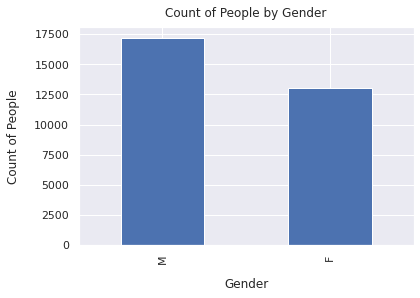

In [ ]:
#data_df = pd.read_csv(('updated_dataframe.csv'))
print('No. of males and females in dataset\n',data_df['Gender'].value_counts())
data_df['Gender'].value_counts().plot(kind='bar');
plt.xlabel("Gender", labelpad=14)
plt.ylabel("Count of People", labelpad=14)
plt.title("Count of People by Gender", y=1.02);

No. of males and females having lung opacity
 M    5560
F    3995
Name: Gender, dtype: int64


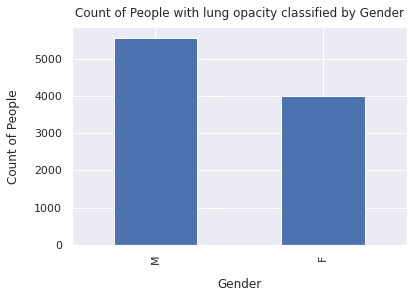

In [ ]:
print('No. of males and females having lung opacity\n',data_df.loc[(data_df['Target'] == 1), 'Gender'].value_counts())
data_df.loc[(data_df['Target'] == 1), 'Gender'].value_counts().plot(kind='bar')
plt.xlabel("Gender", labelpad=14)
plt.ylabel("Count of People", labelpad=14)
plt.title("Count of People with lung opacity classified by Gender", y=1.02);

**SUMMARY OF OBSERVATIONS w.r.t AGE and GENDER**

1.   A higher %age (~57%) of patients sampled are Males
2.   The lung opacities are seen in around 32%(~1/3rd) of the sampled patients in both Males and Females



# **Data Preparation & Augmentation**

In [ ]:
image_name = os.listdir('stage_2_train_images/')

**Lung Opacity (indicative of Pneumonia) locations are now loaded into a dictionary with patientId as key**

**For multiple locations per patientId, the location lists are appended to the patientId key in the dictionary**

**The location lists have values converted from float to int dtype**

In [ ]:
def get_pneumonia_evidence(filename):
    pneumonia_evidence = {}
    df = pd.read_csv(filename)

    for _, row in df.iterrows():
        fn = row[0]
        loc = row[1:5]
        pneumonia = row[5]
        if pneumonia == 1:
            loc = [int(float(i)) for i in loc]
            if fn in pneumonia_evidence:
                pneumonia_evidence[fn].append(loc)
            else:
                pneumonia_evidence[fn] = [loc]
    return pneumonia_evidence

In [ ]:
pneumonia_evidence = get_pneumonia_evidence(filename = 'stage_2_train_labels.csv')


**DATA GENERATOR is used to handle the large dataset which will not fit in memory in its entirety and used to load data into model in randomly shuffled batches of numpy image data and the corresponding numpy masks for segmentation model build**

**Image is resized to (256x256) and dimension added for channel data to complete the input format of images**

**Half the loaded samples are flipped horizontally to augment data**

In [ ]:
class generate(keras.utils.Sequence):#reference kaggle

    def __init__(self, folder, fns, pneumonia_evidence = None, 
                 batch_size = 32, image_size = 256, 
                 shuffle = True, augment = False, predict = False):
        self.folder = folder
        self.fns = fns
        self.pneumonia_evidence = pneumonia_evidence
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()

    def __load__(self, fn):
        img = dcm.dcmread(os.path.join(self.folder, fn)).pixel_array
        msk = np.zeros(img.shape)
        fn = fn.split('.')[0]
        if fn in self.pneumonia_evidence:
            for loc in self.pneumonia_evidence[fn]:
                x, y, w, h = loc
                msk[y:y+h, x:x+w] = 1
        img = resize(img, (self.image_size, self.image_size), mode = 'reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode = 'reflect') > 0.5
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk

    

**Code below randomly picks a Pneumonia positive "PatiendId" (Target=1) from the dataframe and plots the image, its mask for segmentation and also the mask overlay over the image using bitwise AND operation on the image pixel and mask pixel values for each image pixel**

In [ ]:
def plot_masks(df, path, image_fns, pneumonia_evidence):
    sample_patient_id = random.choice(list(df.loc[(df['Target'] == 1), 'patientId']))
    sample_fn = sample_patient_id + '.dcm'
    sample_details = df.loc[df['patientId'] == sample_patient_id]
    
    g = generate(path, image_fns, pneumonia_evidence)
    img, msk = g.__load__(sample_fn)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 6))
    
    _ = ax1.imshow(img[:,:,0], cmap = plt.cm.bone); _ = ax1.axis('off')
    _ = ax2.imshow(msk[:,:,0]); _ = ax2.axis('off')
    _ = ax3.imshow(cv2.bitwise_and(img, img, mask = msk.astype(np.uint8)), 
                cmap = plt.cm.bone); _ = ax3.axis('off')
    _ = ax1.set_title('{}\nAge: {}, Gender: {},\nSample Image'.format(sample_patient_id,
                list(sample_details['Age'].unique())[0], 
                list(sample_details['Gender'].unique())[0]))
    _ = ax2.set_title('{}\nAge: {}, Gender: {}, \nMask for Sample Image'.format(sample_patient_id,
                list(sample_details['Age'].unique())[0], 
                list(sample_details['Gender'].unique())[0]))
    _ = ax3.set_title('{}\nAge: {}, Gender: {} \nMask overlay over Image'.format(sample_patient_id,
                list(sample_details['Age'].unique())[0], 
                list(sample_details['Gender'].unique())[0]
                ))
    plt.subplots_adjust(top = 0.4)
    plt.tight_layout()

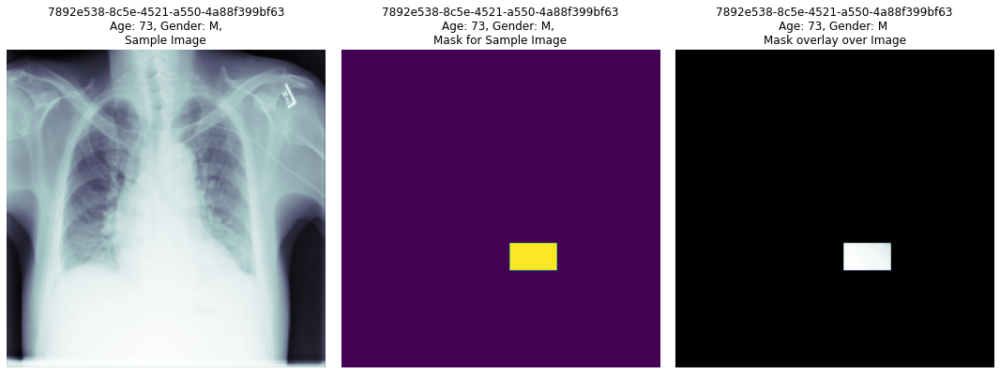

In [ ]:
plot_masks(data_df, 'stage_2_train_images/', image_name, pneumonia_evidence)

In [ ]:
# empty dictionary
pneumonia_locations = {}
# load table
with open(os.path.join('stage_2_train_labels.csv'), mode='r') as infile:
    # open reader
    reader = csv.reader(infile)
    # skip header
    next(reader, None)
    # loop through rows
    for rows in reader:
        # retrieve information
        filename = rows[0]
        location = rows[1:5]
        pneumonia = rows[5]
        # if row contains pneumonia add label to dictionary
        # which contains a list of pneumonia locations per filename
        if pneumonia == '1':
            # convert string to float to int
            location = [int(float(i)) for i in location]
            # save pneumonia location in dictionary
            if filename in pneumonia_locations:
                pneumonia_locations[filename].append(location)
            else:
                pneumonia_locations[filename] = [location]

**SPLIT DATA SAMPLES INTO TRAIN (90%) AND TEST (10%)**

In [ ]:
# load and shuffle filenames
folder = 'stage_2_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
# split into train and validation filenames
n_valid_samples = 2560
train_filenames = filenames[n_valid_samples:]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples
print('Total train images:',len(filenames))
print('Images with pneumonia:', len(pneumonia_locations))

n train samples 24124
n valid samples 2560
Total train images: 26684
Images with pneumonia: 6012


### **DATA Generator with 128x128 image resizing**

In [40]:
class generator(keras.utils.Sequence):
    
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=128, shuffle=True, augment=False, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()
        
    def __load__(self, filename):
        # load dicom file as numpy array
        img = dcm.dcmread(os.path.join(self.folder, filename)).pixel_array
        # create empty mask
        msk = np.zeros(img.shape)
        # get filename without extension
        filename = filename.split('.')[0]
        # if image contains pneumonia
        if filename in self.pneumonia_locations:
            # loop through pneumonia
            for location in self.pneumonia_locations[filename]:
                # add 1's at the location of the pneumonia
                x, y, w, h = location
                msk[y:y+h, x:x+w] = 1
        # resize both image and mask
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode='reflect') > 0.5
        # if augment then horizontal flip half the time
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk
    
    def __loadpredict__(self, filename):
        # load dicom file as numpy array
        img = dcm.dcmread(os.path.join(self.folder, filename)).pixel_array
        # resize image
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        return img
        
    def __getitem__(self, index):
        # select batch
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        # predict mode: return images and filenames
        if self.predict:
            # load files
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            # create numpy batch
            imgs = np.array(imgs)
            return imgs, filenames
        # train mode: return images and masks
        else:
            # load files
            items = [self.__load__(filename) for filename in filenames]
            # unzip images and masks
            imgs, msks = zip(*items)
            # create numpy batch
            imgs = np.array(imgs)
            msks = np.array(msks)
            return imgs, msks
        
    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)
        
    def __len__(self):
        if self.predict:
            # return everything
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            # return full batches only
            return int(len(self.filenames) / self.batch_size)

## **CNN SEGMENTATION MODEL**

In [ ]:
def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
# define iou or jaccard loss function
def iou_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

# combine bce loss and iou loss
def iou_bce_loss(y_true, y_pred):
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

# mean iou as a metric
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

# create network and compiler
model = create_network(input_size=128, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam',
              loss=iou_bce_loss,
              metrics=['accuracy', mean_iou])
model.summary()
# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.001
    epochs = 25
    return lr*(np.cos(np.pi*x/epochs)+1.)/2
learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)



Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 288         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [ ]:
# create train and validation generators
folder = 'stage_2_train_images'
train_gen = generator(folder, train_filenames, pneumonia_locations[0:500], batch_size=32, image_size=128, shuffle=True, augment=True, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations[0:100], batch_size=32, image_size=128, shuffle=False, predict=False)

history = model.fit(train_gen, validation_data=valid_gen, callbacks=[learning_rate], epochs=25, workers=4, use_multiprocessing=True)

In [ ]:
# Calling `save('my_model.h5')` creates a h5 file `my_model.h5`.
model.save("my_CNN_model.h5")

# **MODEL ACCURACY**

In [ ]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()

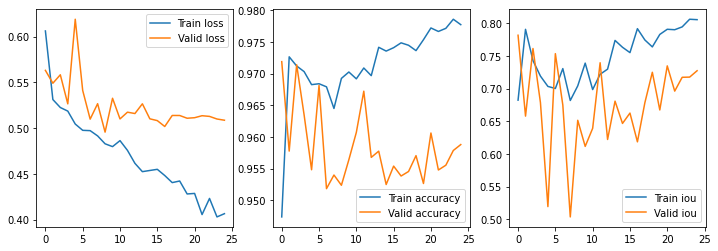

In [ ]:
# Red is predicted mask, Blue is actual Mask
for imgs, msks in valid_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(2, 8, figsize=(20,15))
    
    # Flatten the array
    axarr = axarr.ravel()
    axidx = 0
    
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='b',facecolor='none'))
        
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

  

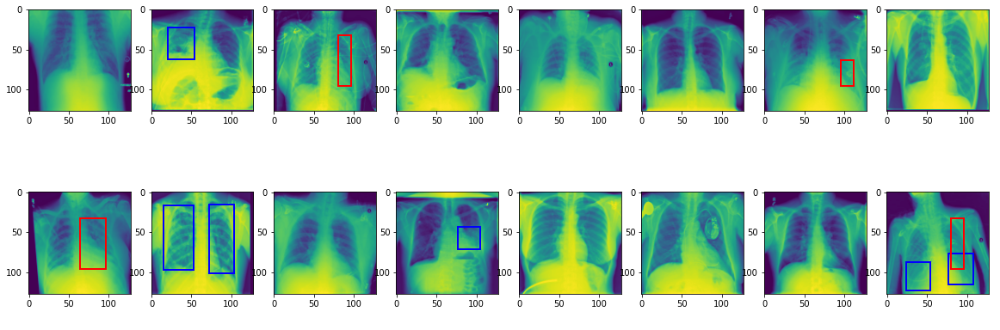

# **Prediction Test**

In [ ]:
# load and shuffle filenames
folder = 'stage_2_test_images'
test_filenames = os.listdir(folder)[:200]
print('n test samples:', len(test_filenames))

# create test generator with predict flag set to True
test_gen = generator(folder, test_filenames, None, batch_size=25, image_size=128, shuffle=False, predict=True)

# create submission dictionary
submission_dict = {}
# loop through testset
for imgs, filenames in test_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # loop through batch
    for pred, filename in zip(preds, filenames):
        # resize predicted mask
        pred = resize(pred, (1024, 1024), mode='reflect')
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            # proxy for confidence score
            conf = np.mean(pred[y:y+height, x:x+width])
            # add to predictionString
            predictionString += str(conf) + ' ' + str(x) + ' ' + str(y) + ' ' + str(width) + ' ' + str(height) + ' '
        # add filename and predictionString to dictionary
        filename = filename.split('.')[0]
        submission_dict[filename] = predictionString
    # stop if we've got them all
    if len(submission_dict) >= len(test_filenames):
        break

# save dictionary as csv file
sub = pd.DataFrame.from_dict(submission_dict,orient='index')
sub.index.names = ['patientId']
sub.columns = ['PredictionString']
sub.to_csv('pneumonia_model_prediction.csv')

n test samples: 200

# **Links to model and pneumonia_model_prediction.csv**

https://docs.google.com/spreadsheets/d/1DP2dzazfDfOd9M936IEh0L7C0Oog7lLpAxuDJ92Xr0M/edit?usp=sharing

https://drive.google.com/file/d/17IrRhd6UmAdZbT_ut4ml324PltPoVJHB/view?usp=sharing

# **Mobile Net**

In [23]:

# creating training dataset
train_dataset=imgArr[0:int(round(len(imgArr)*0.10))]
# creating test dataset
test_dataset=imgArr[int(round(len(imgArr)*0.5)):int(round(len(imgArr)*0.55))]
# creating Validation dataset
validation_dataset=imgArr[int(round(len(imgArr)*0.6)):int(round(len(imgArr)*0.65))]



In [24]:
def get_dict(meta_d,lab_data):
  new_dict={}
  new_dict= {key:value for key, value in lab_data.items() if key in meta_d}
  return new_dict

In [25]:
data_df = pd.read_csv(('updated_dataframe.csv'))
label_data=data_df.groupby(['PathName'])[['x','y','width','height','Target']].apply(lambda x:x.values.tolist()).to_dict()


In [26]:
# creating training bounding Box dataset for image size 512x512
train_datalabel=get_dict(train_dataset,label_data)
# creating testing bounding Box dataset for image size 512x512
test_datalabel=get_dict(test_dataset,label_data)
# creating validation bounding Box dataset for image size 512x512
validation_datalabel=get_dict(validation_dataset,label_data)

In [28]:
# function to resize images to build train,test and validation set
Image_width=512
Image_height=512
Num_channels=1

Orig_width=1024
Orig_height=1024

def resize_image(meta_data,data_lab):
  cropped_images=np.zeros((len(meta_data),Image_width,Image_height),dtype=np.float32)  
  for a in range(len(meta_data)):
    pathname=meta_data[a]
    img=dcm.dcmread(pathname)
    img_pixel=img.pixel_array
    cropped_img=img_pixel[::2,::2]
    cropped_images[a]=cropped_img 
    if pathname in data_lab:
      data=data_lab.get(pathname)
      count=len(data)
      for i in range(count):
        if data[i][4]==1:
          x=int(data[i][0]*Image_width/Orig_width)
          y=int(data[i][1]*Image_height/Orig_height)                                                   
          w=int(data[i][2]*Image_width/Orig_width)
          h=int(data[i][3]*Image_height/Orig_height)
          cropped_images[a]=cv2.rectangle(cropped_images[a],(x,y),(x+w,y+h),(255,0,0),3)
        elif data[i][4]==0:
          cropped_images[a]=cropped_images[a]
  return cropped_images

In [29]:

# creating resized images for training set
train_images=resize_image(train_dataset,train_datalabel)
# creating resized images for test set
test_images=resize_image(test_dataset,test_datalabel)
# creating resized images for vaidation set
validation_images=resize_image(validation_dataset,validation_datalabel)

In [31]:
def get_target(meta_data,data_lab):
  target_var=np.zeros(len(meta_data))
  for a in range(len(meta_data)):
    if meta_data[a] in data_lab:
      data=data_lab.get(meta_data[a])
      count=len(data)
      for i in range(count):
        if data[i][4]==1:
          target_var[a]=int(data[i][4])
        elif data[i][4]==0:
          target_var[a]=int(data[i][4])
  return target_var

In [32]:
train_target=get_target(train_dataset,train_datalabel)
test_target=get_target(test_dataset,test_datalabel)
validation_target=get_target(validation_dataset,validation_datalabel)

In [33]:
x_train = train_images.reshape(train_images.shape[0], Image_width, Image_height,Num_channels)
print(f'Shape of training variables:{x_train.shape}')
y_train = train_target.reshape(train_target.shape[0])
print(f'Shape of target variable in training data:{y_train.shape}')
x_test = test_images.reshape(test_images.shape[0], Image_width, Image_height,Num_channels)
print(f'Shape of test variables:{x_test.shape}')
y_test = test_target.reshape(test_target.shape[0])
print(f'Shape of target variable in test data:{y_test.shape}')

Shape of training variables:(2668, 512, 512, 1)
Shape of target variable in training data:(2668,)
Shape of test variables:(1334, 512, 512, 1)
Shape of target variable in test data:(1334,)


In [1]:
import keras
from keras import Model
from keras.applications.mobilenet import MobileNet,preprocess_input
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau,Callback
from keras.layers import Conv2D,Reshape,Dense,AveragePooling2D,Flatten,Activation
from keras.utils import Sequence
from keras.activations import softmax,sigmoid

In [13]:
def create_model(trainable=True):
  model=MobileNet(input_shape=(512,512,1), alpha=1.0,include_top=False, weights=None, input_tensor=None, pooling=None)
  print(len(model.layers))
  for layer in model.layers:
    layer.trainable=trainable
    x=model.layers[-1].output
    x=Conv2D(1,kernel_size=16,name="bb")(x)
    x=Flatten()(x)
    x=Dense(256,activation='relu')(x)
    x=Dense(2,activation='softmax')(x)
    return Model(model.input,x)

In [14]:
model=create_model()
model.summary()

87
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 512, 512, 1)]     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 513, 513, 1)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 256, 256, 32)      288       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 256, 256, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 256, 256, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 256, 256, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 256, 256, 32)  

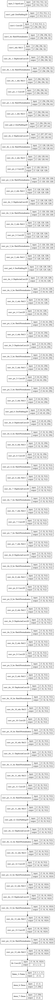

In [15]:
keras.utils.plot_model(model,show_shapes=True)

In [ ]:
def dice_coefficient(y_true, y_pred):
    numerator = 2 * tensorflow.reduce_sum(y_true * y_pred)
    denominator = tensorflow.reduce_sum(y_true + y_pred)

    return numerator / (denominator + tensorflow.keras.backend.epsilon())

In [18]:
from keras.optimizers import Adam
optimizer=Adam()
model.compile(loss='sparse_categorical_crossentropy',optimizer=optimizer,metrics=['accuracy'])

In [19]:
checkpoint = ModelCheckpoint("model-{loss:.2f}.h5", monitor="loss", verbose=1, save_best_only=True,
                             save_weights_only=True, mode="min")
stop = EarlyStopping(monitor="loss", patience=5, mode="min")
reduce_lr = ReduceLROnPlateau(monitor="loss", factor=0.2, patience=5, min_lr=1e-6, verbose=1, mode="min")

In [37]:
history = model.fit(x_train,y_train,validation_data=(x_test,y_test),epochs=5,verbose=1,callbacks=[checkpoint,reduce_lr, stop])

Epoch 1/5
84/84 [==============================] - ETA: 0s - loss: 0.0078 - accuracy: 0.9981
Epoch 00001: loss improved from 0.01179 to 0.00785, saving model to model-0.01.h5
84/84 [==============================] - 64s 762ms/step - loss: 0.0078 - accuracy: 0.9981 - val_loss: 1.1553 - val_accuracy: 0.7834
Epoch 2/5
84/84 [==============================] - ETA: 0s - loss: 0.0257 - accuracy: 0.9944
Epoch 00002: loss did not improve from 0.00785
84/84 [==============================] - 64s 768ms/step - loss: 0.0257 - accuracy: 0.9944 - val_loss: 1.3246 - val_accuracy: 0.8051
Epoch 3/5
84/84 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 0.9981
Epoch 00003: loss improved from 0.00785 to 0.00582, saving model to model-0.01.h5
84/84 [==============================] - 64s 763ms/step - loss: 0.0058 - accuracy: 0.9981 - val_loss: 0.0125 - val_accuracy: 0.9978
Epoch 4/5
84/84 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 0.9989
Epoch 00004: loss imp

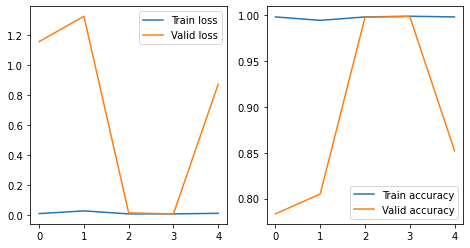

In [38]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()

plt.show()

In [46]:
from skimage import measure
import matplotlib.patches as patches

# load and shuffle filenames
folder = 'stage_2_test_images'
test_filenames = os.listdir(folder)[:100]
print('n test samples:', len(test_filenames))

# create test generator with predict flag set to True
test_gen = generator(folder, test_filenames, None, batch_size=25, image_size=512, shuffle=False, predict=True)

# create submission dictionary
submission_dict = {}
# loop through testset
for imgs, filenames in test_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # loop through batch
    for pred, filename in zip(preds, filenames):
        # resize predicted mask
        pred = resize(pred, (1024, 1024), mode='reflect')
        # threshold predicted mask
        comp = pred[:, : ] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            # proxy for confidence score
            conf = np.mean(pred[y:y+height, x:x+width])
            # add to predictionString
            predictionString += str(conf) + ' ' + str(x) + ' ' + str(y) + ' ' + str(width) + ' ' + str(height) + ' '
        # add filename and predictionString to dictionary
        filename = filename.split('.')[0]
        submission_dict[filename] = predictionString
    # stop if we've got them all
    if len(submission_dict) >= len(test_filenames):
        break

# save dictionary as csv file
sub = pd.DataFrame.from_dict(submission_dict,orient='index')
sub.index.names = ['patientId']
sub.columns = ['PredictionString']
sub.to_csv('pneumonia_MobileNet_model_prediction.csv')


n test samples: 100


# **Links to pneumonia_MobileNet_model_prediction.csv**

https://docs.google.com/spreadsheets/d/1K_Vw2TIy4nGXVTycIRvxSrmEPWkEawlnow_jNQeZiGI/edit?usp=sharing